In [1]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"
import importlib

import time
import numpy as np
import random
import copy
from scipy.special import gammaln, loggamma
import seaborn as sns

from matplotlib.pyplot import show
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as py                                                                                                                                                                                         
import plotly.graph_objs as go
plt.style.use('ggplot')
py.init_notebook_mode()

## Split-merge Gibbs sampling

In [2]:
class Cluster:
    def __init__(self, alpha, L):
        self.alpha = alpha   # concentration hyperparameter
        self.log_gamma = gammaln(self.alpha) - 2. * gammaln(0.5 * self.alpha)   # constant
        self.L = L
        
        self.base_count = np.full((2, self.L), 0., dtype=float)   # base count *without* prior
        self.ndata = 0   # cluster size
        self.log_factorial = 0.   # for calculation of Ewens
        
    def add(self, x):
        self.base_count[x, range(self.L)] += 1
        self.ndata += 1
        if self.ndata > 2:
            self.log_factorial += np.log(self.ndata - 1)
            
    def remove(self, x):
        self.base_count[x, range(self.L)] -= 1
        self.ndata -= 1
        if self.ndata > 2:
            self.log_factorial -= np.log(self.ndata)
        
    # Calculate posterior probability of this cluster
    def calculate_cluster_parameter(self):
        self.cluster_parameter = (self.base_count + 0.5 * self.alpha) / (np.sum(self.base_count, axis=0) + self.alpha)
    
    # <precomputed> == True indicates that cluster parameter is already computed
    def logp_x(self, x, precomputed=False):
        if precomputed:
            return np.sum(np.log(self.cluster_parameter[x, range(self.L)]))
        else:
            return np.sum(np.log((self.base_count[x, range(self.L)] + 0.5 * self.alpha) / (np.sum(self.base_count, axis=0) + self.alpha)))
    
    def calculate_likelihood(self, precomputed=False):
        logp = self.L * self.log_gamma   # TODO: summing for all clusters together is more efficient   # TODO: is this formula OK?

        # XXX: prior should be pevious posterior?
        
        if not precomputed:
            self.calculate_cluster_parameter()
        logp += np.sum(self.base_count * np.log(self.cluster_parameter))
        self.likelihood = logp
        

class Clustering:
    def __init__(self, data, alpha=1., start_from_one_cluster=True):
        self.x = data   # observed units
        self.alpha = 1.
        
        self.N, self.L = self.x.shape   # number of units and variant sites

        self.s = np.zeros(self.N, dtype=int)   # cluster assignment of x
        self.c = {}   # clusters

        if start_from_one_cluster:
            # Initial cluster assignment (all data belong to 1 cluster)
            cluster = Cluster(self.alpha, self.L)
            cluster_idx = 0
            self.c[cluster_idx] = cluster
            for i in range(self.N):
                self.c[cluster_idx].add(self.x[i])
                self.s[i] = cluster_idx
        else:
            # Another initial cluster assignment (each data belongs to each cluster)
            for i in range(self.N):
                cluster = Cluster(self.alpha, self.L)
                self.c[i] = cluster
                self.c[i].add(self.x[i])
                self.s[i] = i

        # constant used for posterior calculation
        self.log_AF = np.sum(np.log(np.array(range(self.N)) + self.alpha))
        
        # constant for new cluster generation in Gibbs sampling
        self.log_normalizer_const = gammaln(self.alpha) - gammaln(self.alpha + 1) + gammaln(0.5 * self.alpha + 1) - gammaln(0.5 * self.alpha)
        #self.log_normalizer_const = np.log(0.5)
        
        # initial cluster likelihood
        for cluster in list(self.c.values()):
            cluster.calculate_likelihood()   # cluster parameters are also calculated
            
        self.max_post = self.calculate_posterior()   # initial posterior
        self.max_s = self.s.copy()
        self.posterior_ncluster = [(self.max_post, len(self.c))]   # store posterior probability and the number of clusters for each iteration
        
    def show_clusters(self):
        for i, cluster in self.c.items():
            print(i, cluster.base_count)
        
    def calculate_posterior(self):
        # Ewens
        logp = len(self.c) * np.log(self.alpha)
        logp += sum([cluster.log_factorial for cluster in list(self.c.values())])
        logp -= self.log_AF
        
        # Cluster likelihood
        # NOTE: all cluster likelihoods should be already updated during samplings
        logp += sum([cluster.likelihood for cluster in list(self.c.values())])

        return logp
    
    def do_split_merge_sampling(self, iterations=100, verbose=False):
        logp_post = self.posterior_ncluster[-1][0]   # the last posterior
        
        for iteration in range(iterations):
            if verbose:
                print("## --- step %d --- ##" % iteration)
                print(self.s)
                print(self.c)

            # Sample two distinct data
            init_i, init_j = random.sample(range(self.N), k=2)

            # Set initial launch state
            s_launch = self.s.copy()
            c_launch = copy.deepcopy(self.c)

            if self.s[init_i] == self.s[init_j]:   # Split
                # Collect a set of restricted observed data
                x_restricted = []
                for j in range(self.N):
                    if j == init_i or j == init_j:
                        continue
                    if self.s[j] == self.s[init_i] or self.s[j] == self.s[init_j]:
                        x_restricted.append(j)

                # Create 2 new clusters consisting of only x[init_i] and x[init_j] respectively, and delete the cluster to which they originally belonged
                # (for the simplification of the following computation)
                # for init_i
                c_idx = max(list(c_launch.keys())) + 1
                cluster = Cluster(self.alpha, self.L)
                c_launch[c_idx] = cluster
                c_launch[c_idx].add(self.x[init_i])
                s_launch[init_i] = c_idx
                # for init_j
                c_idx = max(list(c_launch.keys())) + 1
                cluster = Cluster(self.alpha, self.L)
                c_launch[c_idx] = cluster
                c_launch[c_idx].add(self.x[init_j])
                s_launch[init_j] = c_idx
                # delete
                original_cluster_size = c_launch[self.s[init_i]].ndata   # used to determine iteration number of local Gibbs sampling
                del c_launch[self.s[init_i]]

                c_restricted = [s_launch[init_i], s_launch[init_j]]   # restricted (new) cluster indices for init_i and init_j
                
                if verbose:
                    print(init_i, "(%s)" % self.s[init_i], init_j, "(%s)" % self.s[init_j], "---(split)--->", c_restricted)
                    print(x_restricted)

                # Initial random assignment of each restricted data to one of the two new clusters
                for idx in x_restricted:
                    s_launch[idx] = random.choice(c_restricted)   # TODO: can be removed if performing the following sequential scan?
                    
                # TODO: initial assignment by the column with highest entropy
                # that is, argmin_{col} sum(col) - len(col)/2
                # or, Monte Carlo according to the relative entropy

                if verbose:
                    print("#INITIAL ASSIGNMENT#")
                    print(s_launch)

                ## Perform restricted Gibbs sampling (first sequential scan + several random sampling) on x_resticted
                # First sequential scan (batch update at last)
                # NOTE: originally this should not be performed?
                p_cluster = np.zeros((2, len(x_restricted)))   # [:, 0] for init_i, [:, 1] for init_j
                for i, c_idx in enumerate(c_restricted):
                    c_launch[c_idx].calculate_cluster_parameter()   # precompute parameters of the new clusters (consisting of only 1 data here)
                    p_cluster[i, :] = np.exp(np.array([c_launch[c_idx].logp_x(self.x[idx], precomputed=True) for idx in x_restricted]))   # single-vs-single
                p_acc_cluster = np.add.accumulate(p_cluster / np.sum(p_cluster, axis=0))

                # First assignments to one of the two clusters
                for j, idx in enumerate(x_restricted):
                    rnd = random.random()
                    for k, p in enumerate(p_acc_cluster[:, j]):
                        if p >= rnd:
                            c_idx = c_restricted[k]
                            c_launch[c_idx].add(self.x[idx])
                            s_launch[idx] = c_idx
                            break

                if verbose:
                    print("#FIRST ASSIGNMENT#")
                    print(s_launch)
                
                # Additional Gibbs sampling
                for ii in range(min([100, int(original_cluster_size * 1.5)])):   # TODO: improve this criterion
                    # Drop one (restricted) data randomly
                    r = x_restricted[random.randint(0, len(x_restricted) - 1)]
                    c_launch[s_launch[r]].remove(self.x[r])

                    # Calculate probabilities of assignment
                    logp_cluster = np.array([c_launch[c_idx].logp_x(self.x[r]) for c_idx in c_restricted])   # single-vs-single
                    p_cluster = np.exp(logp_cluster) * np.array([c_launch[c_idx].ndata for c_idx in c_restricted])
                    p_acc_cluster = np.add.accumulate(p_cluster / np.sum(p_cluster))

                    # Assignment
                    rnd = random.random()
                    for k, p in enumerate(p_acc_cluster):
                        if p >= rnd:
                            c_idx = c_restricted[k]
                            c_launch[c_idx].add(self.x[r])
                            s_launch[r] = c_idx
                            break

                    # TODO: should calculate posterior probability and select a result with highest value?

                if verbose:
                    print("#LAST ASSIGNMENT#")
                    print(s_launch)
                
                # This precomputed cluster parameters will be used for the calculations of both q and L below
                for k in range(2):
                    c_launch[c_restricted[k]].calculate_cluster_parameter()   # Update cluster parameters of the new clusters here

                # Calculate q(c^split | c)
                # TODO: this calculation is somewhat heavier than the other two values. Consider pruning when other values are very bad.
                logq = 0.
                for j in x_restricted:   # init_i and init_j are omitted   # TODO: is this proper?
                    k = 0 if s_launch[j] == c_restricted[0] else 1   # assigned cluster
                    c_launch[c_restricted[k]].remove(self.x[j])   # temporarily remove the data
                    # use precomputed parameter for the cluster to which the focal data below does not belong
                    logp_cluster = np.array([c_launch[c_idx].logp_x(self.x[j]) if i == k else c_launch[c_idx].logp_x(self.x[j], precomputed=True) for i, c_idx in enumerate(c_restricted)])
                    p_cluster = np.exp(logp_cluster) * np.array([c_launch[c_idx].ndata for c_idx in c_restricted])
                    logq += np.log(p_cluster[k]) - np.log(np.sum(p_cluster))
                    c_launch[c_restricted[k]].add(self.x[j])   # restore the data

                # Calculate probabilities used for acceptance ratio
                logp_transition = -logq

                logp_ewens = np.log(self.alpha)
                for j in range(2):
                    logp_ewens += c_launch[c_restricted[j]].log_factorial
                logp_ewens -= self.c[self.s[init_i]].log_factorial

                logp_ratio = 0.
                for c_idx in c_restricted:
                    cluster = c_launch[c_idx]
                    cluster.calculate_likelihood(precomputed=True)   # Update likelihoods of the new clusters here
                    logp_ratio += cluster.likelihood
                    if verbose:
                        print("logp_cluster_new", c_idx, "=", cluster.likelihood)
                cluster = self.c[self.s[init_i]]   # likelihood of the original clusters should be already calculated
                if verbose:
                    print("logp_cluster original =", cluster.likelihood)
                logp_ratio -= cluster.likelihood

            else:   # Merge
                c_restricted = [self.s[init_i], self.s[init_j]]   # indices of the clusters to be merged

                if verbose:
                    print(init_i, "(%s)" % c_restricted[0], init_j, "(%s)" % c_restricted[1], "---(merge)--->", c_restricted[1])
                
                # Calculate q(c | c^merge)
                # NOTE: parameters of the clusters to be merged should be already precomputed in the posterior update
                logq = 0.
                for j in range(self.N):
                    if j == init_i or j == init_j:   # to avoid removing these data when a cluster consists of only one of them
                        continue
                    if self.s[j] not in c_restricted:   # filter like <x_restricted> in split
                        continue
                    k = 0 if self.s[j] == c_restricted[0] else 1   # originally assigned cluster
                    c_launch[c_restricted[k]].remove(self.x[j])   # temporarily remove the data
                    # use precomputed parameter for the cluster to which the focal data below does not belong
                    logp_cluster = np.array([c_launch[c_idx].logp_x(self.x[j]) if i == k else c_launch[c_idx].logp_x(self.x[j], precomputed=True) for i, c_idx in enumerate(c_restricted)])
                    p_cluster = np.exp(logp_cluster) * np.array([c_launch[c_idx].ndata for c_idx in c_restricted])
                    logq += np.log(p_cluster[k]) - np.log(np.sum(p_cluster))
                    c_launch[c_restricted[k]].add(self.x[j])   # restore the data

                # Merge two clusters (index c_restricted[0] will be merged to index c_restricted[1])
                c_idx = c_restricted[1]
                for j in range(self.N):
                    if self.s[j] == c_restricted[0]:
                        c_launch[c_idx].add(self.x[j])
                        s_launch[j] = c_idx
                del c_launch[c_restricted[0]]

                # Calculate probabilities used for acceptance ratio
                logp_transition = logq

                logp_ewens = -np.log(self.alpha)
                logp_ewens += c_launch[c_restricted[1]].log_factorial
                for j in range(2):
                    logp_ewens -= self.c[c_restricted[j]].log_factorial

                logp_ratio = 0.
                cluster = c_launch[c_restricted[1]]
                cluster.calculate_likelihood()   # Update likelihood of the new cluster here; cluster parameter is also calculated
                if verbose:
                    print("logp_cluster_new", c_restricted[1], "=", cluster.likelihood)
                logp_ratio += cluster.likelihood
                for c_idx in c_restricted:
                    cluster = self.c[c_idx]
                    if verbose:
                        print("logp_cluster original", c_idx, "=", cluster.likelihood)
                    logp_ratio -= cluster.likelihood
                    
            # Proposal
            logp_proposal = min(0, logp_transition + logp_ewens + logp_ratio)
            if verbose:
                print(logp_proposal, "=", logp_transition, "+", logp_ewens, "+", logp_ratio)
            p_proposal = np.exp(logp_proposal)

            rnd = random.random()
            accepted = False
            if p_proposal >= rnd:
                accepted = True
                self.c = copy.deepcopy(c_launch)
                self.s = s_launch.copy()

            if accepted is True:   # Calculate posterior only when the new state is accepted
                logp_post = self.calculate_posterior()

                updated = "*" if self.max_post < logp_post else ""
                if verbose:
                    print("%sposterior: %f (max so far = %f)" % (updated, logp_post, self.max_post))
                if updated == "*":
                    self.max_post = logp_post
                    self.max_s = self.s.copy()

            self.posterior_ncluster.append((logp_post, len(self.c)))   # if not accepted, the same values as previous state are added
    
    def do_gibbs_sampling(self, iterations=100, verbose=False):
        logp_post = self.posterior_ncluster[-1][0]   # the last posterior
        
        for iteration in range(iterations):
            if verbose:
                print("## --- step %d --- ##" % iteration)

            # Drop 1 assignment in s
            r = random.randint(0, self.N - 1)
            out_cluster = self.s[r]
            self.c[out_cluster].remove(self.x[r])

            if self.c[out_cluster].ndata == 0:
                del self.c[out_cluster]

            # probabilities to be assigned to existing clusters
            logp_cluster = np.zeros(len(self.c.keys()) + 1)
            for i, cluster in enumerate(self.c.values()):
                if i == out_cluster:
                    logp_cluster[i] = np.log(cluster.ndata) - np.log(self.N - 1 + self.alpha) + cluster.logp_x(self.x[r])
                else:
                    logp_cluster[i] = np.log(cluster.ndata) - np.log(self.N - 1 + self.alpha) + cluster.logp_x(self.x[r], precomputed=True)

            # probability to be assigned to a new cluster
            logp_cluster[-1] = np.log(self.alpha) - np.log(self.N - 1 + self.alpha) + self.L * self.log_normalizer_const   # TODO: define as constant?

            p_cluster = np.exp(logp_cluster) / np.sum(np.exp(logp_cluster))   # normalized probabilities for assignment
            p_acc_cluster = np.add.accumulate(p_cluster)   # accumulated probabilities

            # assign new cluster based on the p
            rnd = random.random()
            for i, p in enumerate(p_acc_cluster):
                if p >= rnd:
                    if i < len(self.c):   # existing cluster
                        c_idx = list(self.c.keys())[i]
                    else:   # new cluster
                        c_idx = max(list(self.c.keys())) + 1
                        cluster = Cluster(self.alpha, self.L)
                        self.c[c_idx] = cluster
                    break
            
            self.c[c_idx].add(self.x[r])
            self.s[r] = c_idx
            
            if out_cluster != c_idx:   # dropped data is assigned to a different cluster (change in clustering)
                if verbose:
                    print("%d (%d) -> %d (%d)" % (r, self.s[r], i, c_idx), p_cluster)
                    print(self.s)
                
                # Update parameters and likelihoods of the changed clusters here
                if out_cluster in self.c:   # when not dissapeared
                    self.c[out_cluster].calculate_likelihood()
                self.c[c_idx].calculate_likelihood()
                    
                logp_post = self.calculate_posterior()
                if self.max_post < logp_post:
                    if verbose:
                        print("# %f -> %f #" % (self.max_post, logp_post), self.s)
                    self.max_post = logp_post
                    self.max_s = self.s.copy()

            self.posterior_ncluster.append((logp_post, len(self.c)))
            
    def plot_transition(self, start=0, end=None, figsize=(10, 8)):
        fig, ax1 = plt.subplots(figsize=figsize)
        ax1.plot([x[0] for x in self.posterior_ncluster[start:end]], color='r')
        ax2 = ax1.twinx()
        ax2.plot([x[1] for x in self.posterior_ncluster[start:end]], color='b')
        plt.grid(False)
        plt.show()

In [3]:
def heatmap_partition(data, cluster_index, partition_width=1):
    d = np.full((data.shape[0], data.shape[1] + partition_width * (len(set(cluster_index)) + 1)), -1, dtype=int)
    start = partition_width
    for idx in set(cluster_index):
        cluster_data = data[:, np.where(cluster_index == idx)[0]]
        d[:, start:start + cluster_data.shape[1]] = cluster_data
        start += cluster_data.shape[1] + partition_width
    
    plt.subplots(figsize=(18,15))
    sns.heatmap(d, cbar=False)
    plt.show()

## Synthetic data

In [2]:
def generate_data(r, n):
    data = np.full((n, len(r)), 0, dtype=int)
    for i in range(n):
        d = r.copy()
        for j in range(len(d)):
            if d[j] == 1:
                if random.random() <= pe:
                    d[j] = 0
            elif d[j] == 0:
                if random.random() <= pe / 3:
                    d[j] = 1
        data[i, :] = d
    return data

In [3]:
r1 = []
for i in range(100):
    if random.random() < 0.3:
        r1.append(1)
    else:
        r1.append(0)
pe = 0.15
r1 = np.array(r1)

In [4]:
ndiff = 5

r2 = r1.copy()
r2[10:10+ndiff] = 1 - r1[10:10+ndiff]
r3 = r1.copy()
r3[50:50+ndiff] = 1 - r1[50:50+ndiff]

In [5]:
data = np.concatenate((generate_data(r1, 100), generate_data(r2, 50), generate_data(r3, 50)), axis = 0)

In [6]:
data.shape

(200, 100)

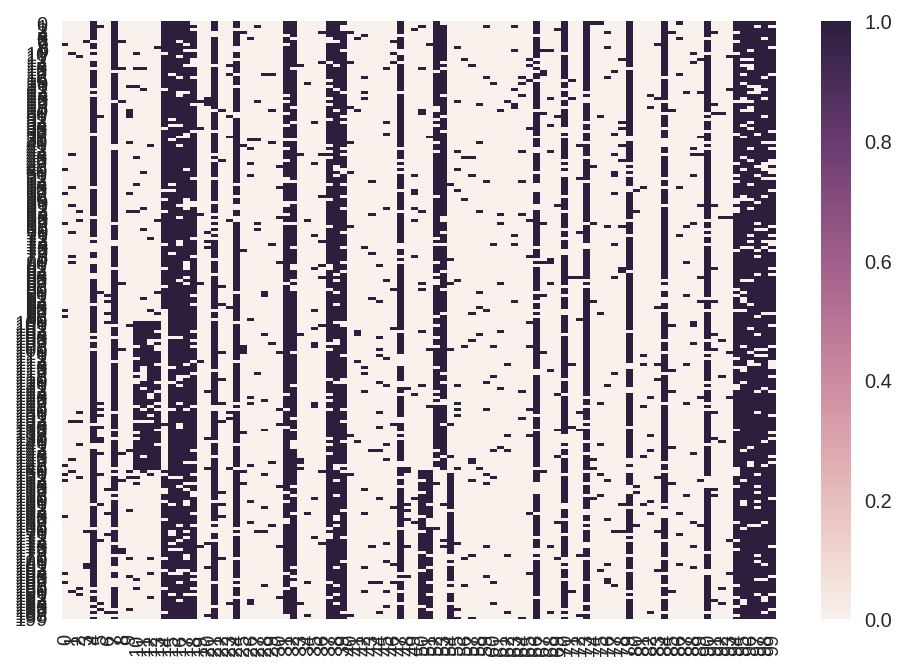

In [7]:
sns.heatmap(data)

In [271]:
data = data.T   # clustering of variants

In [120]:
test = Clustering(data=data)

In [121]:
test.do_split_merge_sampling(iterations=100, verbose=False)

In [202]:
test.do_gibbs_sampling(iterations=30000, verbose=False)

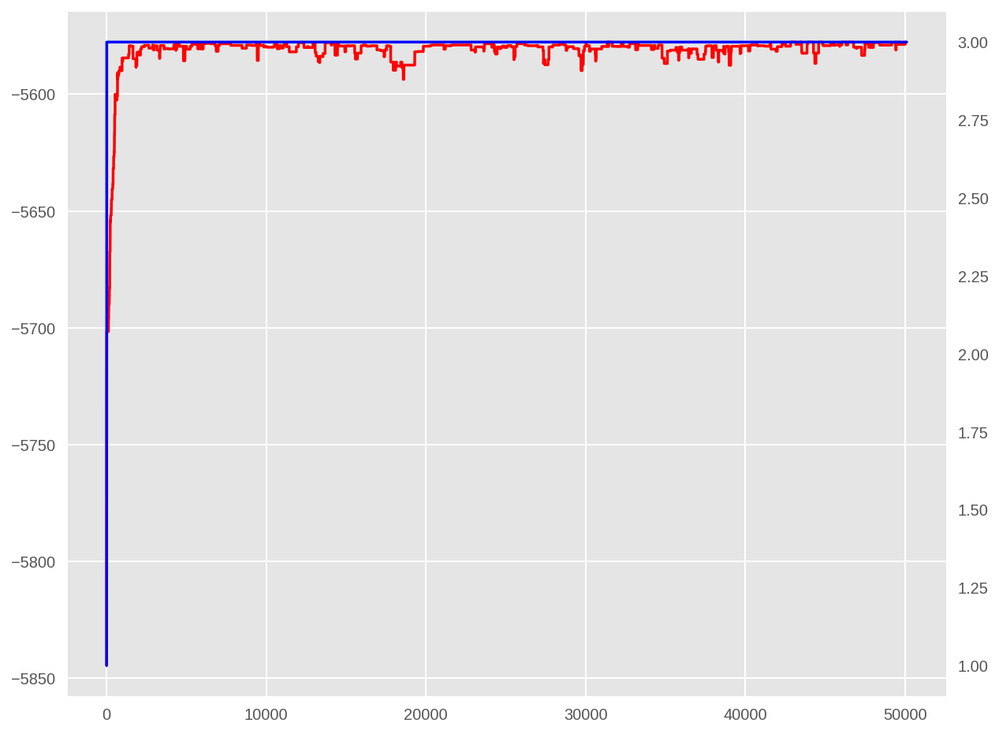

In [203]:
test.plot_transition(figsize=(10,8))

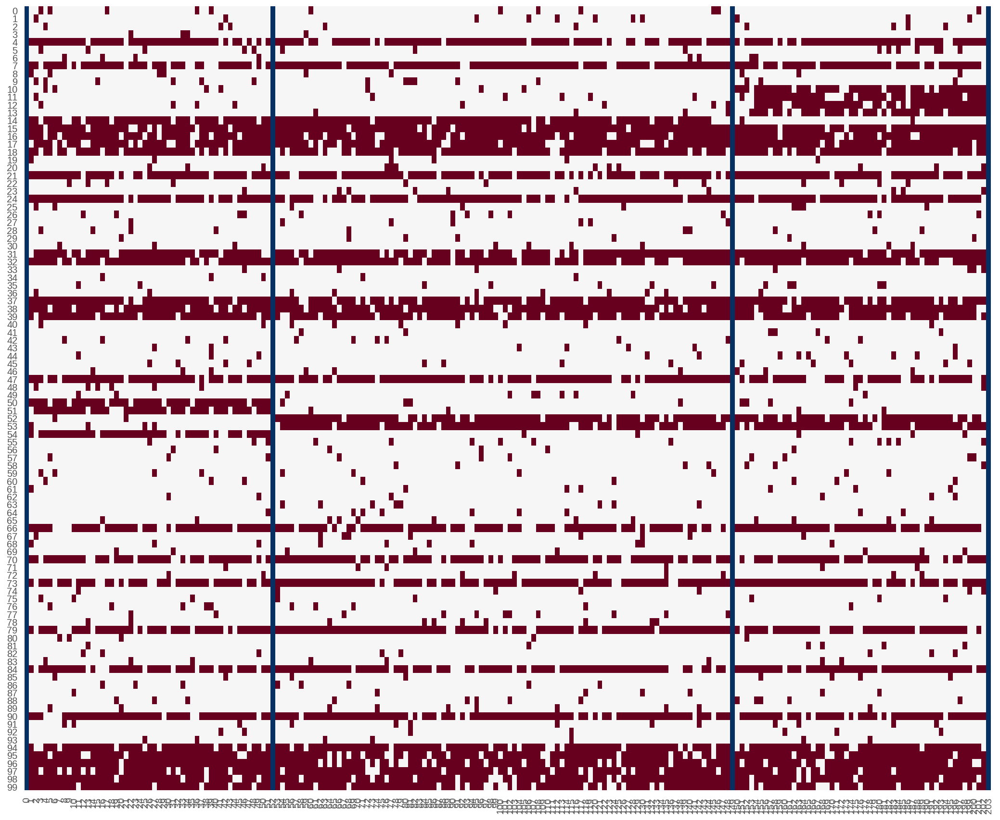

In [204]:
heatmap_partition(test.x.T, test.max_s)

## Real data

In [160]:
v = np.full((93, 888), 93, dtype=int)   # TODO: why discrepancy between len(out_seqs ) and width of consed output?

root_dir = "/home/ysuzuki/work/RepeatAssembly/datruf_run/dmel/backup/"
with open('%speak_small/peak.3.unit.1.seqs.V' % (root_dir), 'r') as f:
    for i, line in enumerate(f):
        v[i, :] = list(map(int, list(line.strip())))

data = v.T

In [161]:
data.shape

(888, 93)

In [162]:
real = Clustering(data=data)

In [179]:
real.do_split_merge_sampling(iterations=10000, verbose=False)

In [197]:
real.do_gibbs_sampling(iterations=100000, verbose=False)

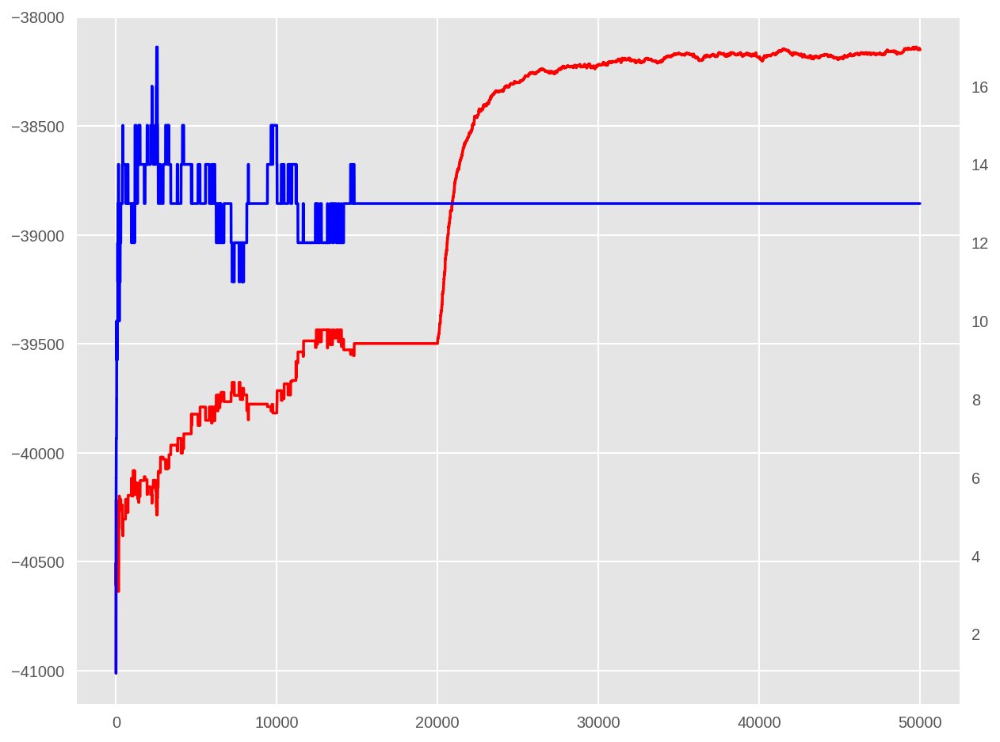

In [206]:
real.plot_transition(end=50000, figsize=(10,8))

In [201]:
real.max_s

array([114, 114, 114, 114, 126, 139, 125, 126, 125, 143,  77, 126, 126,
       125, 125, 122, 122, 114, 114, 114, 114, 114, 114, 114, 114, 114,
       114, 114, 114, 114, 114, 135,  77,  77,  77, 143, 136, 135, 125,
       139, 136, 139, 136, 135, 125, 125, 125, 135, 139, 139, 139, 139,
       136, 139, 125, 125, 135, 125, 125, 135, 135,  77, 136,  77, 136,
       143, 142, 125, 126, 125, 125, 143, 125, 125, 143, 125, 143, 125,
       143, 142,  77, 143, 139, 142, 125, 119, 119, 125, 119, 119, 119,
       125, 119, 125, 114, 114, 126, 135, 139, 125, 142, 119, 139, 126,
       139, 143, 139, 125, 126, 125, 125, 126,  77, 139, 139, 125, 142,
       125, 119, 139, 139, 126, 136, 139, 126, 139, 136, 139, 142, 125,
       139, 119, 119, 119, 119, 119, 119, 119, 119,  77, 143,  77, 143,
       126, 143, 139, 126,  77, 139, 143, 143, 143, 143, 143, 143, 139,
       143, 125, 143, 143, 143, 125, 126, 143, 143, 126, 143, 126, 143,
       135, 139, 125, 139, 139, 139, 126, 119, 119, 125, 126, 11

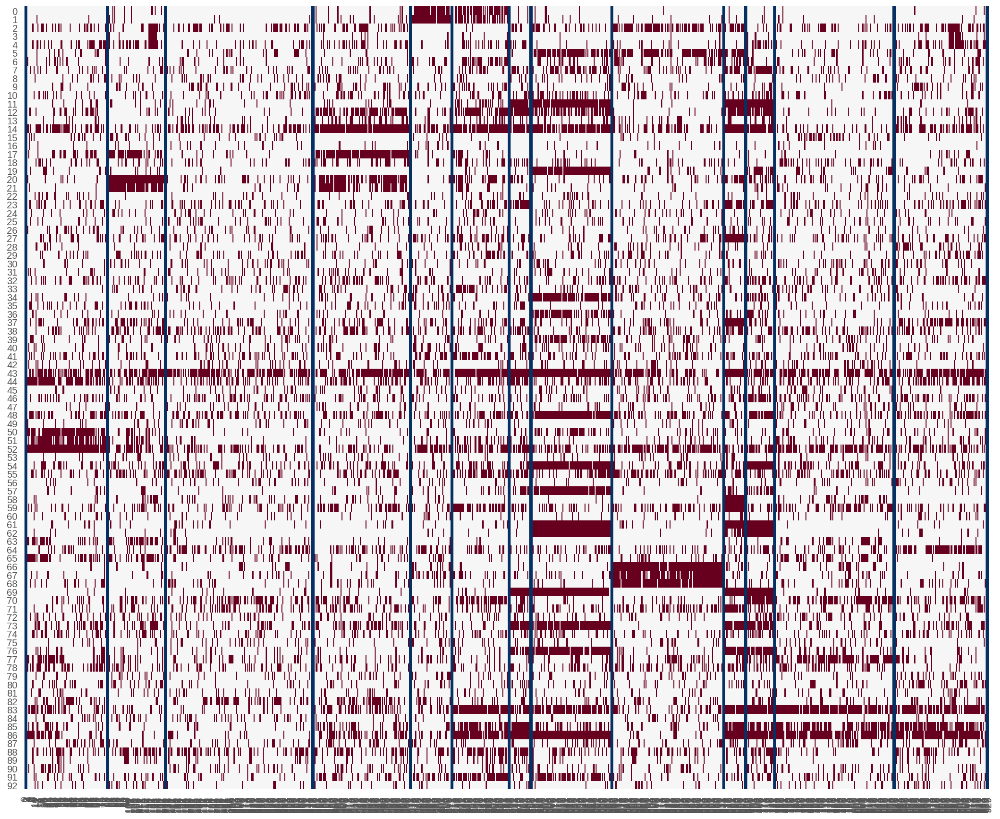

In [200]:
heatmap_partition(real.x.T, real.max_s, partition_width=3)

### previous result

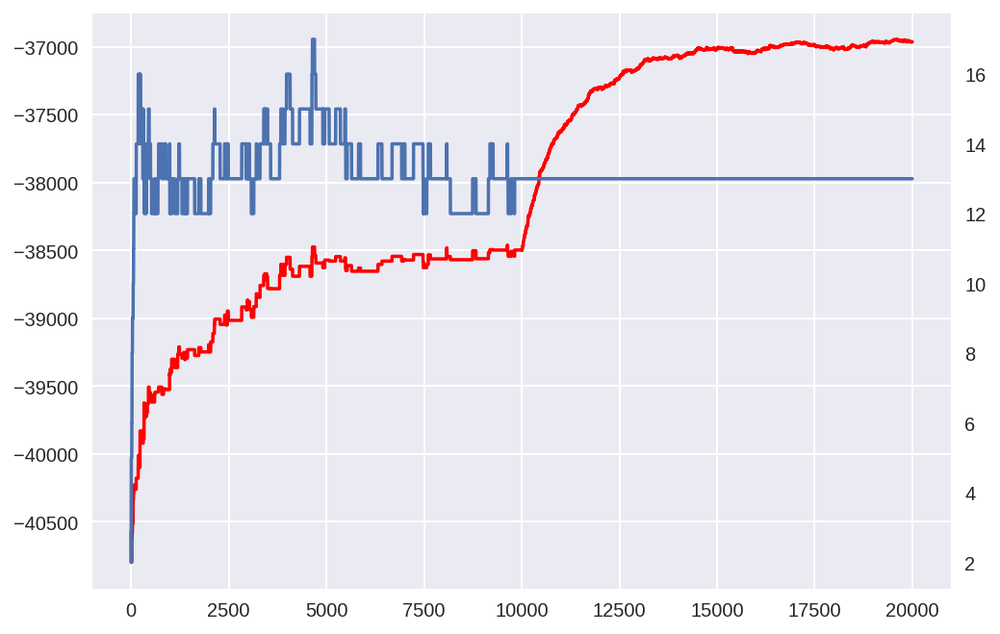

In [205]:
fig, ax1 = plt.subplots()
ax1.plot([x[0] for x in post_ncluster[0:20000]], color='r')
ax2 = ax1.twinx()
ax2.plot([x[1] for x in post_ncluster[0:20000]])
plt.grid(False)
plt.show()

~10000 iterations: split-merge MCMC (MH + local Gibbs sampling), 10000~40000 iterations: Gibbs sampling

In [203]:
max_s

array([116, 116, 116, 116, 154, 150, 154, 154, 154, 155, 155, 141, 154,
       154, 154, 106, 106, 116, 116, 116, 116, 116, 116, 116, 116, 116,
       116, 116, 116, 116, 116, 110, 155, 155, 150,  89, 156, 110, 110,
       150, 156, 141, 156, 110, 154, 154, 154, 110, 154, 150, 150, 110,
       156, 110, 150, 150, 110, 110, 110, 110, 110, 155, 156, 155, 155,
       155, 127, 154, 150, 154, 154, 155, 154, 154, 155, 154, 155, 154,
       155, 127, 155, 155, 150, 127, 150, 146, 146, 154, 146, 146, 146,
       154, 146, 154, 116, 116, 141, 110, 150, 110, 127, 150, 150, 154,
       150, 141, 150, 154, 141, 154, 154, 150, 155, 155, 150, 154, 127,
       154, 154, 141, 155, 141, 156, 155, 154, 150, 156, 150, 155, 154,
       150, 146, 146, 146, 146, 146, 146, 146, 146, 155,  89, 155,  89,
       154,  89, 150, 154, 141, 150, 141, 155,  89, 141,  89, 154, 150,
       141, 154,  89,  89,  89, 154, 141,  89,  89, 141,  89, 141,  89,
       150, 150, 154, 150, 154, 150, 154, 146, 146, 154, 154, 14

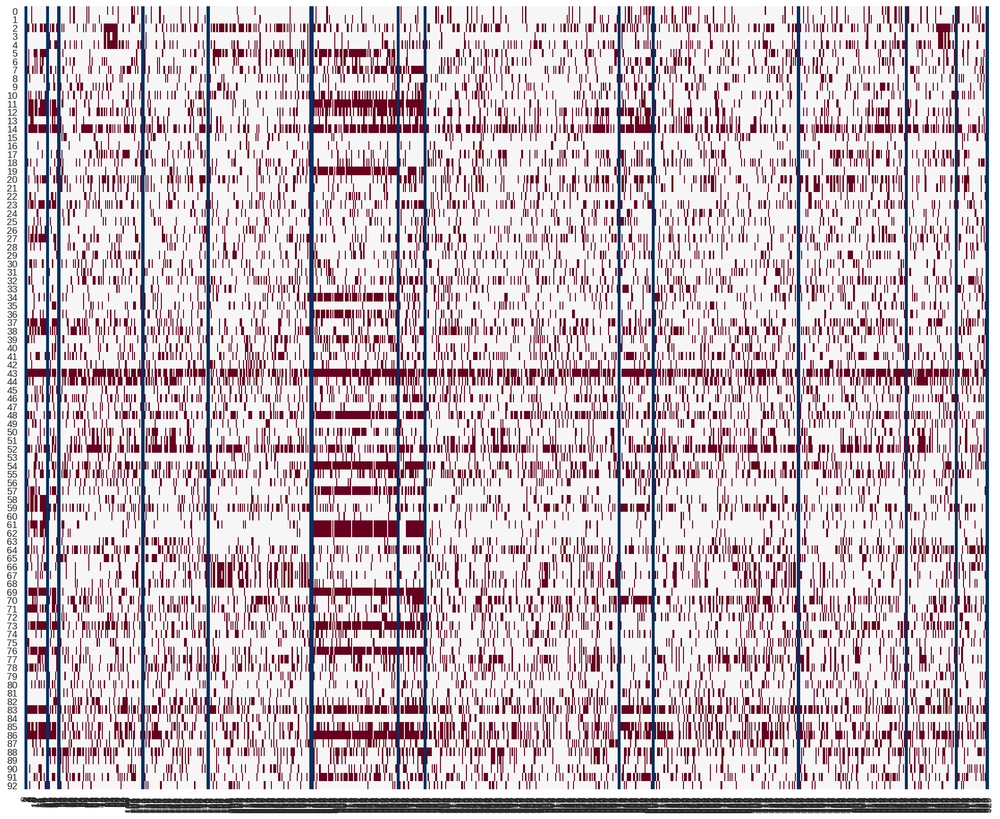

In [204]:
heatmap_partition(v, max_s, partition_width=3)

## Large real data

In [4]:
from dacenter_run import *

In [5]:
# Reload module
import dacenter_run
importlib.reload(dacenter_run)
from dacenter_run import *

In [5]:
root_dir = "/home/ysuzuki/work/RepeatAssembly/datruf_run/dmel/"
vmatrix = load_vmatrix(root_dir + "backup/peak/peak.3.unit.1.seqs.V")

In [8]:
large = Clustering(data=vmatrix)

In [46]:
t0 = time.time()
large.do_split_merge_sampling(iterations=4000, verbose=False)
t1 = time.time()
t1 - t0

476.16576766967773

In [39]:
t0 = time.time()
large.do_gibbs_sampling(iterations=100000, verbose=False)
t1 = time.time()
t1 - t0

359.3400344848633

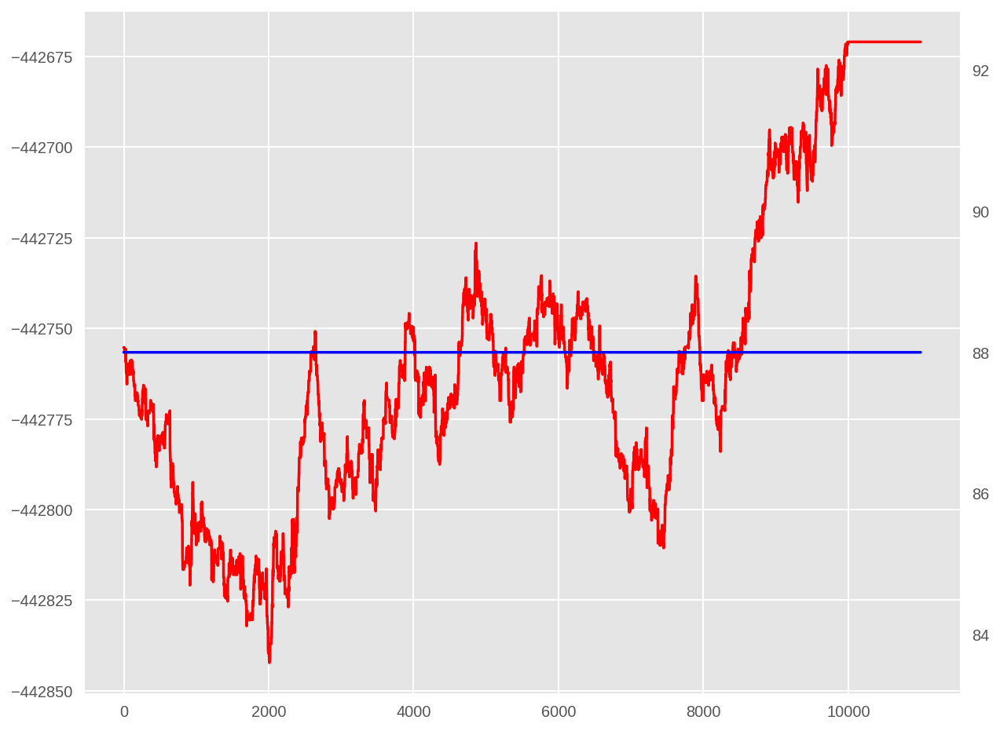

In [45]:
large.plot_transition(start=390000, figsize=(10,8))

In [41]:
large.max_s[:1000]

array([886, 547, 907, 728, 863, 728, 703, 812, 903, 878, 566, 916, 681,
       895, 681, 907, 547, 829, 907, 566, 916, 828, 895, 828, 897, 905,
       517, 862, 905, 851, 878, 542, 862, 909, 862, 833, 903, 678, 833,
       211, 909, 909, 903, 905, 878, 708, 708, 833, 728, 833, 862, 905,
       898,  30, 833, 777, 555, 320, 542, 838, 863, 566, 895, 903, 856,
       851, 812, 863, 718, 909, 897, 542, 470, 812, 555, 859, 905, 703,
       555, 555, 776, 859, 843, 542, 896, 211, 726, 766, 497, 747, 728,
       775, 678, 903, 859, 703, 678, 497, 470, 678, 840, 497, 497, 747,
       747, 747, 903, 833, 741, 766, 643, 819, 903, 903, 863, 838, 542,
       897, 838, 897, 726, 812, 678, 726, 678, 708, 905, 886, 907, 681,
       895, 886, 681, 681, 916, 566, 895, 895, 915, 907, 566, 681, 907,
       862, 555, 862, 719, 903, 909, 862, 903, 819, 853, 819, 776, 851,
       838, 812, 703, 812, 726, 909, 320, 718, 914, 898, 643, 726, 775,
       766, 726, 856, 726, 843, 909, 859, 905, 776, 517, 517,  3

### previous result

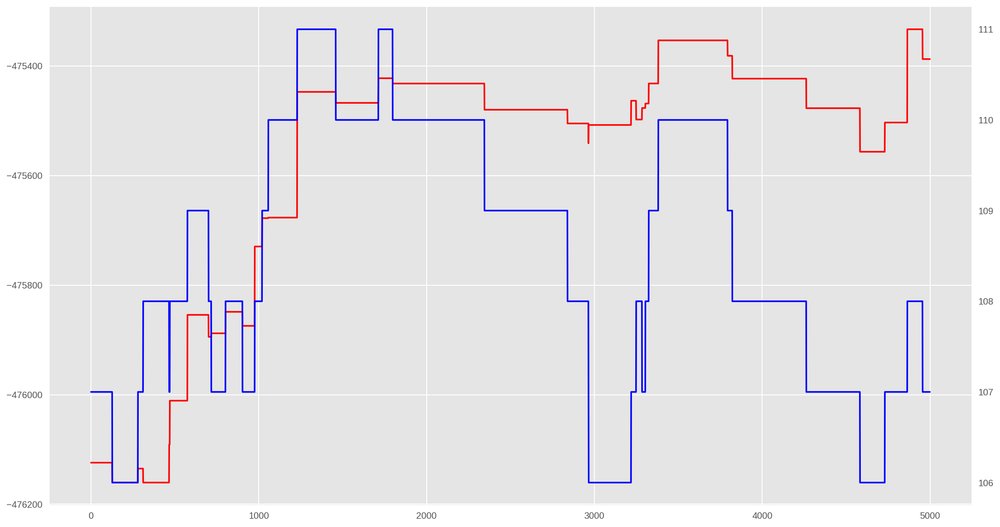

In [73]:
fig, ax1 = plt.subplots(figsize=(18, 10))
ax1.plot([x[0] for x in post_ncluster[40000:]], color='r')
ax2 = ax1.twinx()
ax2.plot([x[1] for x in post_ncluster[40000:]], color='b')
plt.grid(False)
plt.show()

In [72]:
max_s[:1000]

array([372, 255, 359, 259, 465, 264, 480, 480, 163, 264, 210, 212, 427,
       495, 358, 505, 358, 210, 427, 279, 427, 360, 359, 211, 212, 385,
       497, 355, 478, 497, 491, 283, 128, 283, 277, 454, 497, 259, 355,
       259, 241, 277, 480, 121, 341, 498, 434, 259, 505, 434, 492, 128,
       465, 407, 259, 491, 465, 465, 475, 328, 465, 387, 427, 465, 448,
       259, 277, 328, 259, 448, 505, 458, 241, 277, 465, 494, 385, 361,
       448, 465, 470, 492, 403, 491, 458, 482, 475, 458, 361, 277, 498,
       326, 435, 480, 475, 505, 471, 434, 480, 498, 434, 471, 478, 235,
       328, 376, 498, 397, 285, 475, 277, 128, 163, 497, 241, 340, 475,
       458, 212, 458, 488, 277, 448, 403, 451, 434, 465, 413, 486, 495,
       358, 413, 359, 359, 334, 413, 211, 387, 210, 442, 334, 359, 255,
       355, 169, 450, 491, 491, 385, 328, 259, 498, 498, 497, 397, 465,
       491, 480, 285, 277, 494, 482, 277, 241, 128, 362, 505, 403, 470,
       458, 403, 448, 494, 403, 397, 285, 478, 277, 454, 277, 28